<a href="https://colab.research.google.com/github/oliviks/census_income/blob/main/Kiepek__census_income_imbalanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://archive.ics.uci.edu/dataset/20/census+income

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from imblearn.under_sampling import RandomUnderSampler
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Train set - presampled

## Loading the original df

In [ ]:
names= 'age, workclass, fnlwgt, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loss, hours-per-week, native-country, income'


In [ ]:
col_names = names.split(', ')

In [ ]:
col_names

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/ML_final_project/adult_data_train.csv',names=col_names)

## Exploratory Data Analysis

In [ ]:
df_train.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


There are NULL values, represented by ' ?'.

In [ ]:
df_train.income.unique()

array([' <=50K', ' >50K'], dtype=object)

In [ ]:
df_train.shape

(32561, 15)

In [ ]:
df_train.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


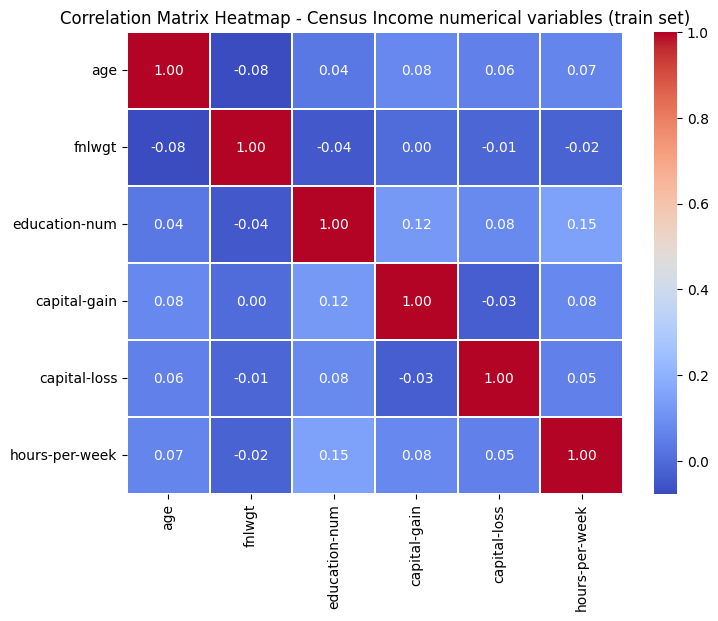

In [ ]:
correlation_matrix_num_var = df_train[['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week']].corr()

# Heatmap
plt.figure(figsize=(8, 6))
# cmap = colormap
# fmt = format string for the annotations
#".2f" =  floating-point numbers with two decimal places
#  linewidths = width of the lines that will divide each cell in the heatmap
sns.heatmap(correlation_matrix_num_var, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation Matrix Heatmap - Census Income numerical variables (train set)')
plt.show()

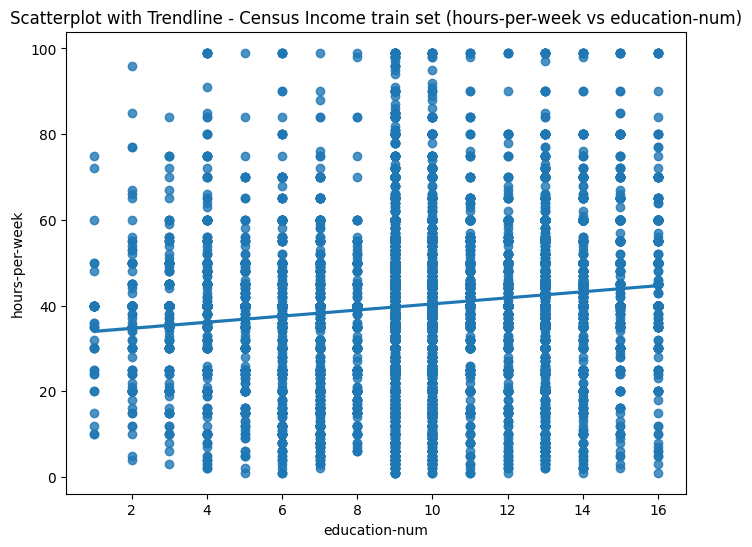

In [ ]:
# Scatterplot with trendline
plt.figure(figsize=(8, 6))
sns.regplot(x='education-num', y='hours-per-week', data=df_train)
plt.title('Scatterplot with Trendline - Census Income train set (hours-per-week vs education-num)')
plt.show()

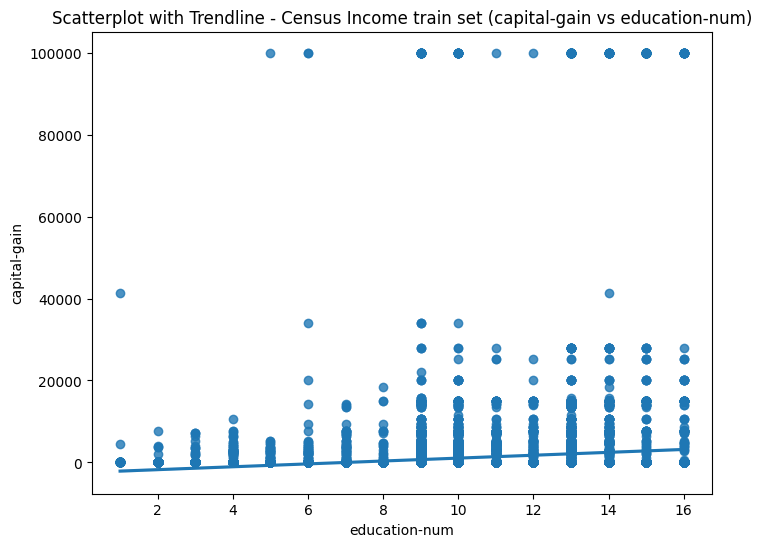

In [ ]:
# Scatterplot with trendline
plt.figure(figsize=(8, 6))
sns.regplot(x='education-num', y='capital-gain', data=df_train)
plt.title('Scatterplot with Trendline - Census Income train set (capital-gain vs education-num)')
plt.show()

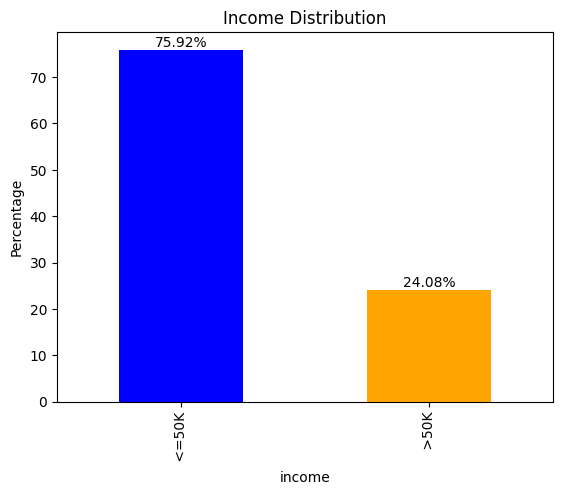

In [ ]:
# Calculating value counts and converting to percentages
income_counts = df_train['income'].value_counts(normalize=True) * 100

# Plotting the bar chart with percentages
fig, ax = plt.subplots()
bars = income_counts.plot(kind='bar', ax=ax, color=['blue', 'orange'])

# Adding percentages on top of the bars
for bar in bars.patches:
    ax.annotate(f'{bar.get_height():.2f}%',
                (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                ha='center', va='bottom')

plt.ylabel('Percentage')
plt.title('Income Distribution')
plt.show()

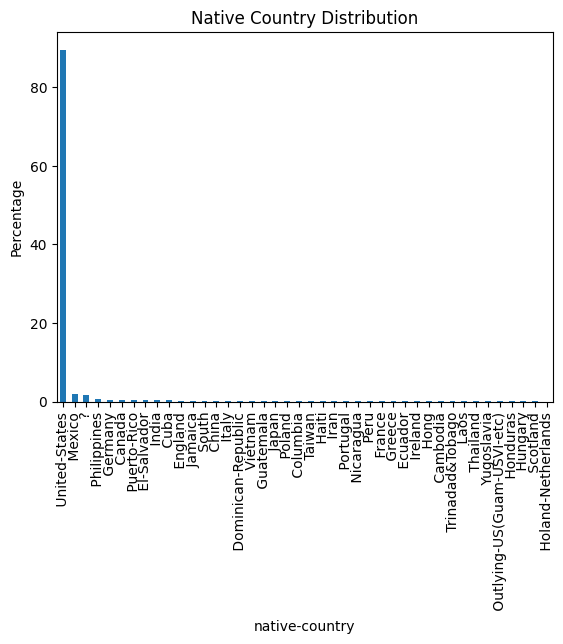

In [ ]:
# Calculating value counts and converting to percentages
country_counts = df_train['native-country'].value_counts(normalize=True) * 100

# Plotting the bar chart with percentages
fig, ax = plt.subplots()
bars = country_counts.plot(kind='bar', ax=ax)


plt.ylabel('Percentage')
plt.title('Native Country Distribution')
plt.show()

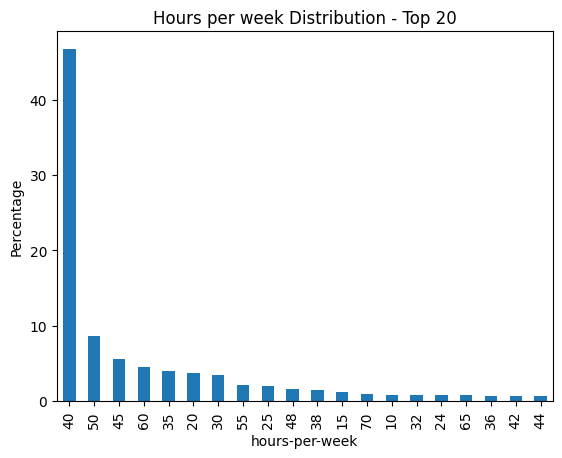

In [ ]:
# Calculating value counts and converting to percentages
hour_counts = df_train['hours-per-week'].value_counts(normalize=True).head(20) * 100

# Plotting the bar chart with percentages for top 20
fig, ax = plt.subplots()
bars = hour_counts.plot(kind='bar', ax=ax)

plt.ylabel('Percentage')
plt.title('Hours per week Distribution - Top 20')
plt.show()


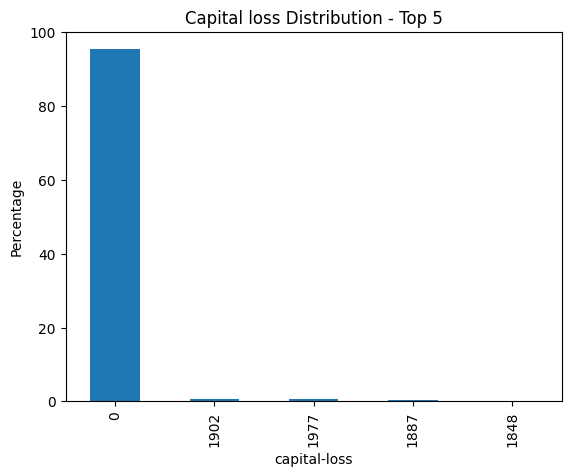

In [ ]:
# Calculating value counts and converting to percentages
loss_counts = df_train['capital-loss'].value_counts(normalize=True).head(5) * 100

# Plotting the bar chart with percentages
fig, ax = plt.subplots()
bars = loss_counts.plot(kind='bar', ax=ax)


plt.ylabel('Percentage')
plt.title('Capital loss Distribution - Top 5')
plt.show()

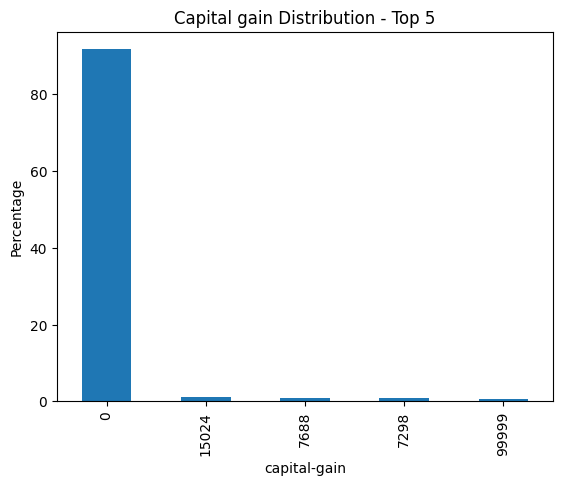

In [ ]:
# Calculating value counts and converting to percentages
gain_counts = df_train['capital-gain'].value_counts(normalize=True).head(5) * 100

# Plotting the bar chart with percentages
fig, ax = plt.subplots()
bars = gain_counts.plot(kind='bar', ax=ax)


plt.ylabel('Percentage')
plt.title('Capital gain Distribution - Top 5')
plt.show()

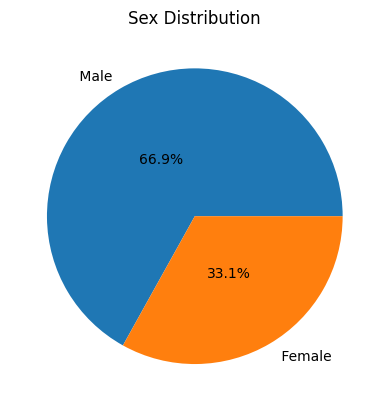

In [ ]:
# Calculating value counts and converting to percentages
sex_counts = df_train['sex'].value_counts(normalize=True) * 100

# Plotting the pie chart with percentages
fig, ax = plt.subplots()
pie = sex_counts.plot(kind='pie', ax=ax, autopct='%1.1f%%', pctdistance=0.45) #The '%1.1f%%' format string means that the pie chart will display the percentage values with 1 digit precision.  pctdistance is used to position the labels closer to or farther from the center of the pie slices.

plt.ylabel('')
plt.title('Sex Distribution')
plt.show()


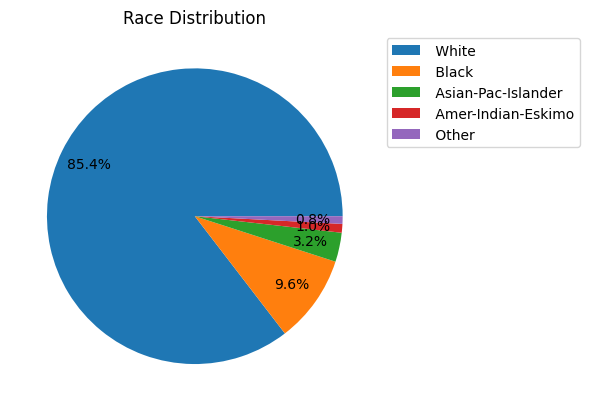

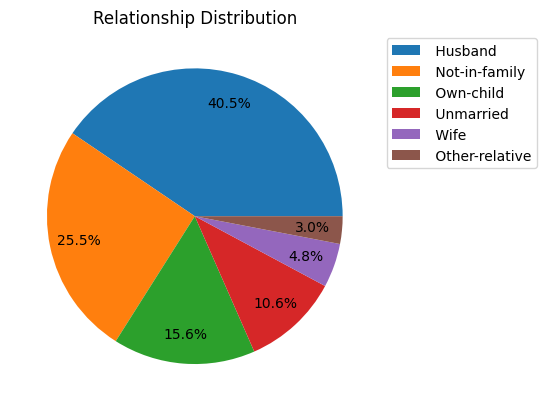

In [ ]:
variables_for_pie = ['race', 'relationship']

for var in variables_for_pie:
    # Calculating value counts and converting to percentages
    counts = df_train[var].value_counts(normalize=True) * 100

    # Plotting the pie chart with percentages
    fig, ax = plt.subplots()
    pie = counts.plot(kind='pie', ax=ax, labels=None, autopct='%1.1f%%', pctdistance=0.8)

    # Moving the legend outside of the pie chart to prevent label overlap
    plt.legend(bbox_to_anchor=(1,1),  labels=counts.index)

    plt.ylabel('')
    plt.title(f'{var.capitalize()} Distribution')
    plt.show()


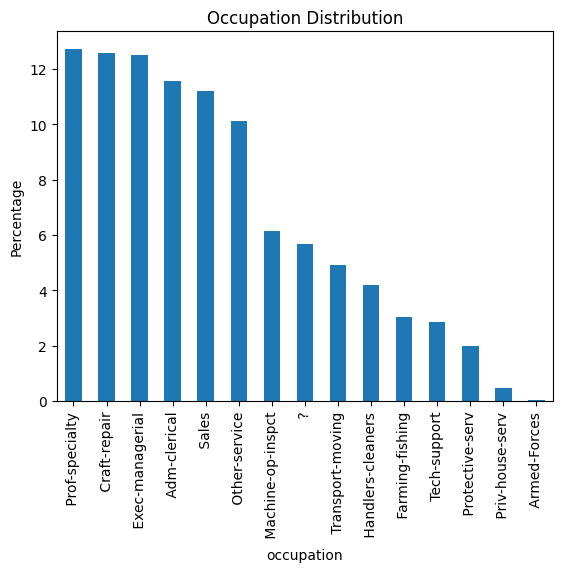

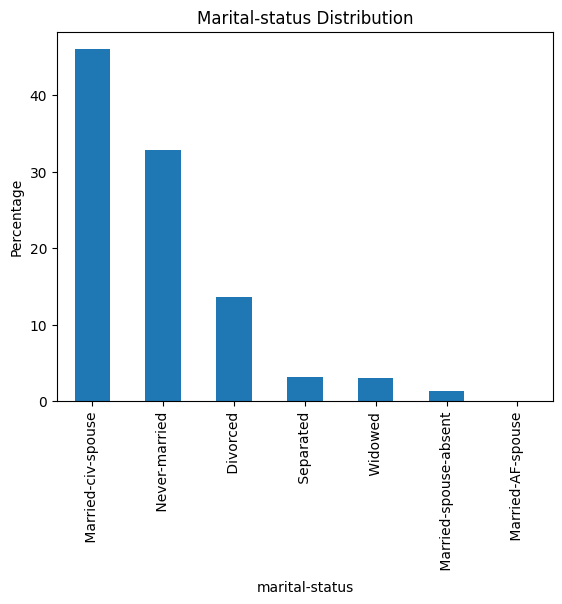

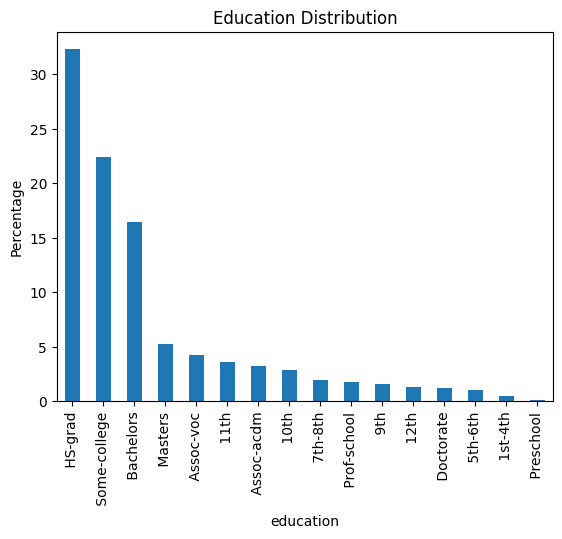

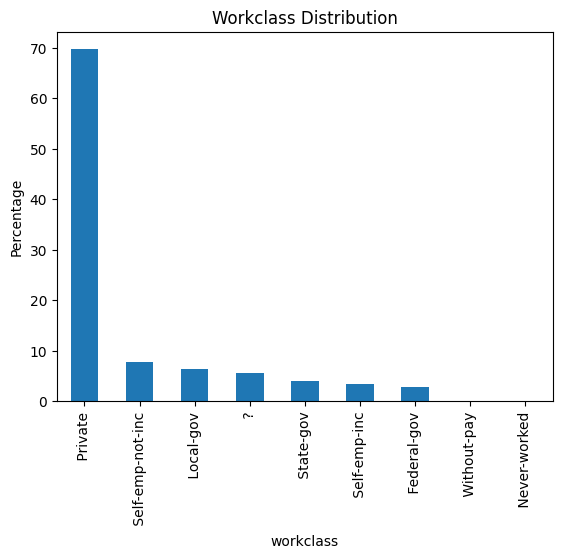

In [ ]:
variables_for_bar = ['occupation', 'marital-status', 'education', 'workclass']

for var in variables_for_bar:
    # Calculating value counts and converting to percentages
    counts = df_train[var].value_counts(normalize=True) * 100

    # Plotting the bar chart with percentages
    fig, ax = plt.subplots()
    bar = counts.plot(kind='bar', ax=ax)

    plt.ylabel('Percentage')
    plt.title(f'{var.capitalize()} Distribution')
    plt.show()


In [ ]:
df_train.head(100)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,29,Local-gov,115585,Some-college,10,Never-married,Handlers-cleaners,Not-in-family,White,Male,0,0,50,United-States,<=50K
96,48,Self-emp-not-inc,191277,Doctorate,16,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,1902,60,United-States,>50K
97,37,Private,202683,Some-college,10,Married-civ-spouse,Sales,Husband,White,Male,0,0,48,United-States,>50K
98,48,Private,171095,Assoc-acdm,12,Divorced,Exec-managerial,Unmarried,White,Female,0,0,40,England,<=50K


In [ ]:
df_train.tail(100)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
32461,24,Private,284317,Bachelors,13,Never-married,Machine-op-inspct,Not-in-family,White,Female,0,0,32,United-States,<=50K
32462,48,Self-emp-inc,185041,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,7298,0,50,United-States,>50K
32463,58,Local-gov,223214,HS-grad,9,Married-civ-spouse,Other-service,Husband,White,Male,0,0,40,United-States,<=50K
32464,45,Self-emp-inc,173664,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
32465,66,Private,269665,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,0,25,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


It seems that the row sequence is randomized.

## Train set modifications

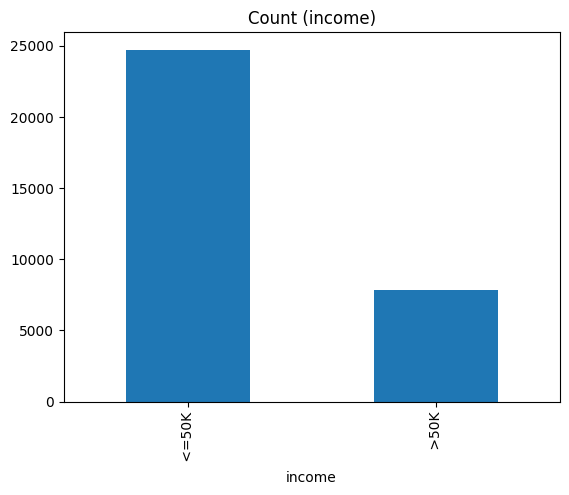

In [ ]:
df_train.income.value_counts().plot(kind='bar', title='Count (income)');

In [ ]:
df_train.income.value_counts()

income
 <=50K    24720
 >50K      7841
Name: count, dtype: int64

In [ ]:
categorical_columns = df_train.select_dtypes(include=['object']).columns

In [ ]:
categorical_columns

Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'race', 'sex', 'native-country', 'income'],
      dtype='object')

In [ ]:
df_train.workclass.unique()

array([' State-gov', ' Self-emp-not-inc', ' Private', ' Federal-gov',
       ' Local-gov', ' ?', ' Self-emp-inc', ' Without-pay',
       ' Never-worked'], dtype=object)

In [ ]:
df_train.education.unique()

array([' Bachelors', ' HS-grad', ' 11th', ' Masters', ' 9th',
       ' Some-college', ' Assoc-acdm', ' Assoc-voc', ' 7th-8th',
       ' Doctorate', ' Prof-school', ' 5th-6th', ' 10th', ' 1st-4th',
       ' Preschool', ' 12th'], dtype=object)

In [ ]:
df_train.rename(columns={'marital-status': 'marital_status'}, inplace=True)

In [ ]:
df_train.marital_status.unique()

array([' Never-married', ' Married-civ-spouse', ' Divorced',
       ' Married-spouse-absent', ' Separated', ' Married-AF-spouse',
       ' Widowed'], dtype=object)

In [ ]:
df_train.occupation.unique()

array([' Adm-clerical', ' Exec-managerial', ' Handlers-cleaners',
       ' Prof-specialty', ' Other-service', ' Sales', ' Craft-repair',
       ' Transport-moving', ' Farming-fishing', ' Machine-op-inspct',
       ' Tech-support', ' ?', ' Protective-serv', ' Armed-Forces',
       ' Priv-house-serv'], dtype=object)

In [ ]:
df_train.relationship.unique()

array([' Not-in-family', ' Husband', ' Wife', ' Own-child', ' Unmarried',
       ' Other-relative'], dtype=object)

In [ ]:
df_train.race.unique()

array([' White', ' Black', ' Asian-Pac-Islander', ' Amer-Indian-Eskimo',
       ' Other'], dtype=object)

In [ ]:
df_train.sex.unique()

array([' Male', ' Female'], dtype=object)

In [ ]:
df_train.rename(columns={'native-country': 'native_country'}, inplace=True)

In [ ]:
df_train.native_country.unique()

array([' United-States', ' Cuba', ' Jamaica', ' India', ' ?', ' Mexico',
       ' South', ' Puerto-Rico', ' Honduras', ' England', ' Canada',
       ' Germany', ' Iran', ' Philippines', ' Italy', ' Poland',
       ' Columbia', ' Cambodia', ' Thailand', ' Ecuador', ' Laos',
       ' Taiwan', ' Haiti', ' Portugal', ' Dominican-Republic',
       ' El-Salvador', ' France', ' Guatemala', ' China', ' Japan',
       ' Yugoslavia', ' Peru', ' Outlying-US(Guam-USVI-etc)', ' Scotland',
       ' Trinadad&Tobago', ' Greece', ' Nicaragua', ' Vietnam', ' Hong',
       ' Ireland', ' Hungary', ' Holand-Netherlands'], dtype=object)

In [ ]:
df_train.income.unique()

array([' <=50K', ' >50K'], dtype=object)

In [ ]:
df_train = pd.get_dummies(df_train, columns=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'], prefix=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'])

In [ ]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K,income_ >50K
0,39,77516,13,2174,0,40,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
1,50,83311,13,0,0,13,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
2,38,215646,9,0,0,40,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
3,53,234721,7,0,0,40,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
4,28,338409,13,0,0,40,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False


In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K,income_ >50K
0,39,77516,13,2174,0,40,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
1,50,83311,13,0,0,13,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
2,38,215646,9,0,0,40,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,F

In [ ]:
boolean_columns = df_train.select_dtypes(include=['bool']).columns
print(list(boolean_columns))

['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers

In [ ]:
df_train[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_train[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

In [ ]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K,income_ >50K
0,39,77516,13,2174,0,40,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
1,50,83311,13,0,0,13,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
2,38,215646,9,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3,53,234721,7,0,0,40,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
4,28,338409,13,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
df_train = df_train.drop('income_ <=50K', axis = 1)

## Sampling

In [ ]:
df_train_o = df_train # saving the original, imbalanced data into a seperate variable as a backup

 The code below is preparing a dataset for analysis or modeling and defining a function to visualize the data in a 2D space. The visualization is particularly useful for understanding the distribution of the classes (in this case, ‘income_ >50K’) in the dataset. However, please note that this function assumes that X is a 2D array, so it will only plot the first two features of X. If X has more than two features, I might need to use techniques like PCA (Principal Component Analysis) or t-SNE to reduce the dimensionality of data before visualizing it in 2D.

In [ ]:
X = df_train.drop('income_ >50K', axis=1)
y = df_train['income_ >50K']

def plot_2d_space(X, y, label='Classes'):
    colors = ['#1F77B4', '#FF7F0E']
    markers = ['o', 's']
    for l, c, m in zip(np.unique(y), colors, markers):
        plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m, alpha=0.4, edgecolors='w', s=5
        )
    plt.title(label)
    plt.legend(loc='upper right')
    plt.show()

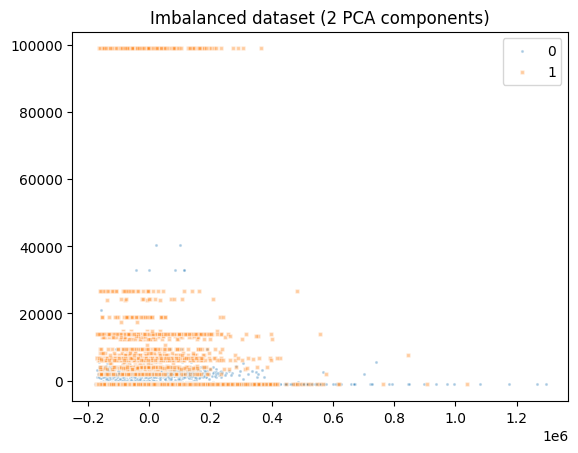

In [ ]:
pca = PCA(n_components=2) # This line initializes a PCA object that will reduce data to 2 dimensions
X = pca.fit_transform(X) # This line fits the PCA model to the data X and then applies the dimensionality reduction

plot_2d_space(X, y, 'Imbalanced dataset (2 PCA components)')

Please note that PCA is a linear transformation, so it might not capture complex, non-linear relationships in the data. Also, PCA transformation is unsupervised -> it doesn't take into account the labels y when finding the new axes. So, the axes that PCA finds are the ones that maximize the variance in X, not necessarily the ones that best separate the classes.

In [ ]:
income_percentages = df_train['income_ >50K'].value_counts(normalize=True) * 100
print(income_percentages)

income_ >50K
0    75.919044
1    24.080956
Name: proportion, dtype: float64


There are much more '0s' than '1s' which is not that clear from the plot.

### Under/Oversampler

**Steps**

In [ ]:
"""# Getting the current class distribution
class_counts = y.value_counts()
print('--------Current class distribution--------')
print(class_counts)
minority_class = class_counts.idxmin() #1
print('--------Minority class--------')
print(minority_class)
majority_class = class_counts.idxmax() #0
print('--------Majority class--------')
print(majority_class)"""

"# Getting the current class distribution\nclass_counts = y.value_counts()\nprint('--------Current class distribution--------')\nprint(class_counts)\nminority_class = class_counts.idxmin() #1\nprint('--------Minority class--------')\nprint(minority_class)\nmajority_class = class_counts.idxmax() #0\nprint('--------Majority class--------')\nprint(majority_class)"

In [ ]:
"""# Defining the desired ratio
minority_class_count = int(0.05 * len(y))
majority_class_count = int(0.95 * len(y))"""

'# Defining the desired ratio\nminority_class_count = int(0.05 * len(y))\nmajority_class_count = int(0.95 * len(y))'

In [ ]:
"""# Ensuring the desired count for each class is feasible
# Ensuring the desired count for each class does not exceed the actual count
desired_ratio = {
    # min between desired class count and current
    minority_class: min(minority_class_count, class_counts[minority_class]),
    majority_class: min(majority_class_count, class_counts[majority_class])
}"""

'# Ensuring the desired count for each class is feasible\n# Ensuring the desired count for each class does not exceed the actual count\ndesired_ratio = {\n    # min between desired class count and current\n    minority_class: min(minority_class_count, class_counts[minority_class]),\n    majority_class: min(majority_class_count, class_counts[majority_class])\n}'

In [ ]:
"""# Checking the current class distribution
print("Original class distribution:", y.value_counts(normalize=True))"""

'# Checking the current class distribution\nprint("Original class distribution:", y.value_counts(normalize=True))'

In [ ]:
"""# Applying undersampling or oversampling
# if num_desired > num_current
if desired_ratio[minority_class] > class_counts[minority_class]:
    sampler = RandomOverSampler(sampling_strategy=desired_ratio)
else:
    sampler = RandomUnderSampler(sampling_strategy=desired_ratio)

X_resampled, y_resampled = sampler.fit_resample(X, y)"""

'# Applying undersampling or oversampling\n# if num_desired > num_current\nif desired_ratio[minority_class] > class_counts[minority_class]:\n    sampler = RandomOverSampler(sampling_strategy=desired_ratio)\nelse:\n    sampler = RandomUnderSampler(sampling_strategy=desired_ratio)\n\nX_resampled, y_resampled = sampler.fit_resample(X, y)'

In [ ]:
"""# Checking new class distribution
print("Resampled class distribution:", y_resampled.value_counts(normalize=True))"""

'# Checking new class distribution\nprint("Resampled class distribution:", y_resampled.value_counts(normalize=True))'

In [ ]:
"""# Combining X_resampled and y_resampled into a new dataframe
resampled_train_df = X_resampled.copy()
resampled_train_df['income_ >50K'] = y_resampled

# Displaying the first few rows of the new dataframe
resampled_train_df.head()"""

"# Combining X_resampled and y_resampled into a new dataframe\nresampled_train_df = X_resampled.copy()\nresampled_train_df['income_ >50K'] = y_resampled\n\n# Displaying the first few rows of the new dataframe\nresampled_train_df.head()"

**Whole code**

In [ ]:
# Setting the random seed for reproducibility
random_seed = 42

X = df_train.drop(columns=['income_ >50K'])
y = df_train['income_ >50K']

class_counts = y.value_counts()
minority_class = class_counts.idxmin()
majority_class = class_counts.idxmax()

minority_class_count = int(0.05 * len(y))
majority_class_count = int(0.95 * len(y))

desired_ratio = {
    minority_class: min(minority_class_count, class_counts[minority_class]),
    majority_class: min(majority_class_count, class_counts[majority_class])
}

print("Original class distribution:", y.value_counts(normalize=True))

if desired_ratio[minority_class] > class_counts[minority_class]:
    sampler = RandomOverSampler(sampling_strategy=desired_ratio, random_state=random_seed)
else:
    sampler = RandomUnderSampler(sampling_strategy=desired_ratio, random_state=random_seed)

X_resampled, y_resampled = sampler.fit_resample(X, y)

print("Resampled class distribution:", y_resampled.value_counts(normalize=True))

resampled_train_df = X_resampled.copy()
resampled_train_df['income_ >50K'] = y_resampled

resampled_train_df.head()


Original class distribution: income_ >50K
0    0.75919
1    0.24081
Name: proportion, dtype: float64
Resampled class distribution: income_ >50K
0    0.938212
1    0.061788
Name: proportion, dtype: float64


,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
0,32,43403,10,0,1590,54,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,51,332243,13,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,27,158156,9,0,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,64,170421,10,0,0,8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Saving the new df:

In [ ]:
file_path = '/content/drive/MyDrive/ML_final_project/resampled_train_df.csv'

resampled_train_df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")

DataFrame saved to /content/drive/MyDrive/ML_final_project/resampled_train_df.csv


# Train set (with proper ratios) modification

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/ML_final_project/resampled_train_df.csv')

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
df_train.shape

(26348, 109)

In [ ]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
0,32,43403,10,0,1590,54,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,51,332243,13,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,27,158156,9,0,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,64,170421,10,0,0,8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [ ]:
print(df_train.columns)

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov',
       'workclass_ Local-gov', 'workclass_ Never-worked',
       ...
       'native_country_ Puerto-Rico', 'native_country_ Scotland',
       'native_country_ South', 'native_country_ Taiwan',
       'native_country_ Thailand', 'native_country_ Trinadad&Tobago',
       'native_country_ United-States', 'native_country_ Vietnam',
       'native_country_ Yugoslavia', 'income_ >50K'],
      dtype='object', length=109)


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26348 entries, 0 to 26347
Columns: 109 entries, age to income_ >50K
dtypes: int64(109)
memory usage: 21.9 MB


In [ ]:
# 1. Using describe() for a statistical summary
print(df_train.describe(include='all'))

# 2. Using DataFrame.dtypes to get the data types of all columns
print(df_train.dtypes)

# 3. Using a loop to print detailed information about each column
for column in df_train.columns:
    print(f"Column: {column}")
    print(f"Unique values: {df_train[column].nunique()}")
    #print(f"Missing values: {df_train[column].isnull().sum()}")
    print(f"Data type: {df_train[column].dtype}")
    print("-" * 40)


                age        fnlwgt  education-num  capital-gain  capital-loss  \
count  26348.000000  2.634800e+04   26348.000000  26348.000000  26348.000000   
mean      37.237665  1.900443e+05       9.718688    383.431532     61.194246   
std       13.947638  1.059652e+05       2.484651   3834.734288    335.340392   
min       17.000000  1.228500e+04       1.000000      0.000000      0.000000   
25%       26.000000  1.176322e+05       9.000000      0.000000      0.000000   
50%       35.000000  1.789480e+05       9.000000      0.000000      0.000000   
75%       46.000000  2.384752e+05      11.000000      0.000000      0.000000   
max       90.000000  1.484705e+06      16.000000  99999.000000   4356.000000   

       hours-per-week  workclass_ ?  workclass_ Federal-gov  \
count    26348.000000  26348.000000            26348.000000   
mean        39.262980      0.064141                0.025125   
std         12.377675      0.245009                0.156508   
min          1.000000      

In [ ]:
# 4. Combining column-specific information into a DataFrame
detailed_info = pd.DataFrame({
    'Column': df_train.columns,
    'Non-Null Count': df_train.notnull().sum(), # NULLs are represented by ' ?'
 #   'Null Count': df_train.isnull().sum(),
    'Unique Count': df_train.nunique(),
    'Dtype': df_train.dtypes
})

detailed_info

,Column,Non-Null Count,Unique Count,Dtype
age,age,26348,73,int64
fnlwgt,fnlwgt,26348,19043,int64
education-num,education-num,26348,16,int64
capital-gain,capital-gain,26348,113,int64
capital-loss,capital-loss,26348,87,int64
hours-per-week,hours-per-week,26348,94,int64
workclass_ ?,workclass_ ?,26348,2,int64
workclass_ Federal-gov,workclass_ Federal-gov,26348,2,int64
workclass_ Local-gov,workclass_ Local-gov,26348,2,int64
workclass_ Never-worked,workclass_ Never-worked,26348,2,int64


List of dummies representing NA values:

In [ ]:
# List to store column names with the suffix "_ ?"
columns_with_suffix = []

# Iterating through each column in the DataFrame
for column in df_train.columns:
    if column.endswith('_ ?'):
        columns_with_suffix.append(column)

print("Columns with the suffix '_ ?':")
for column in columns_with_suffix:
    print(column)


Columns with the suffix '_ ?':
workclass_ ?
occupation_ ?
native_country_ ?


In [ ]:
# Initializing a dictionary to store the count of 1s (which represent NULL values) for each column
null_value_counts = {}

# Iterating through each column with the suffix '_ ?' and counting the occurrences of 1s
for column in columns_with_suffix:
    null_value_counts[column] = df_train[column].sum()

print("Count of NULL values represented by 1s in each column with the suffix '_ ?':")
for column, count in null_value_counts.items():
    print(f"{column}: {count}")

Count of NULL values represented by 1s in each column with the suffix '_ ?':
workclass_ ?: 1690
occupation_ ?: 1697
native_country_ ?: 465


In [ ]:
num_rows = len(df_train)
print(f"Number of rows in df_train: {num_rows}")

Number of rows in df_train: 26348


In [ ]:
for column, count in null_value_counts.items():
    decimal_fraction = count / num_rows
    print(f"{column}: {decimal_fraction:.4f}")

workclass_ ?: 0.0641
occupation_ ?: 0.0644
native_country_ ?: 0.0176


In [ ]:
# Looking whether I can detect any patterns
df_train[df_train['native_country_ ?'] == 1]

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
65,25,250038,11,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
256,43,244172,9,0,0,35,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
271,18,74054,7,0,0,20,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
288,21,335570,10,0,0,30,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
308,27,209801,10,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
378,31,176185,13,4064,0,40,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
397,33,137310,9,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

Since NAs in the 'native_country' column account for 1.76% of the data, I will simply drop the rows for which native_country_ ? = 1

In [ ]:
# Dropping rows where native_country_ ? is 1
df_train = df_train[df_train['native_country_ ?'] != 1]

# Resetting index after dropping rows
df_train.reset_index(drop=True, inplace=True)

df_train.drop(columns=['native_country_ ?'], inplace=True)

<ipython-input-16-00f3fcab0173>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop(columns=['native_country_ ?'], inplace=True)


Also, I think that race can be a proxy for country origin. Not to mention that it can be more meaningful theoretically when predicting income.

In [ ]:
# Looking whether I can detect any patterns
df_train[df_train['occupation_ ?'] == 1]
# I can see that when 'occupation_ ?' = 1, workclass_ ? = 1 very often

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,22,120572,10,0,0,40,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
23,21,405684,9,0,0,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
26,24,33339,10,0,0,20,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
31,35,273558,10,0,0,30,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
56,65,106910,7,0,0,15,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
69,20,210781,10,0,0,10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

Partial correlation matrix:

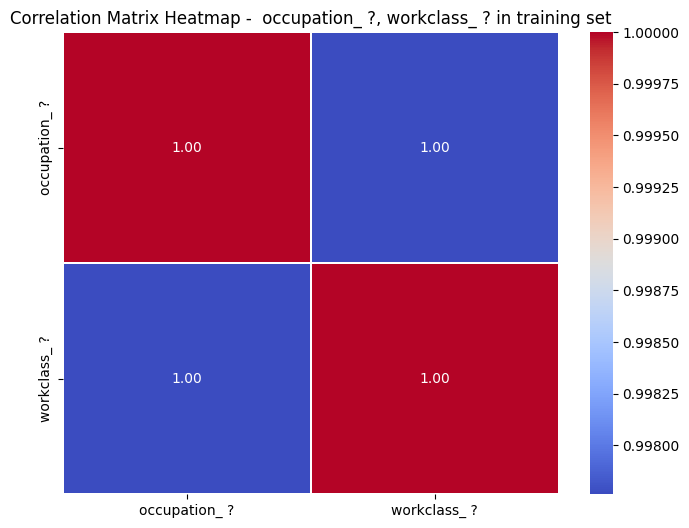

In [ ]:
corr_matr_NAoccupation_NAworkclass= df_train[['occupation_ ?', 'workclass_ ?']].corr()

# Heatmap
plt.figure(figsize=(8, 6))
# cmap = colormap
# fmt = format string for the annotations
#".2f" =  floating-point numbers with two decimal places
#  linewidths = width of the lines that will divide each cell in the heatmap
sns.heatmap(corr_matr_NAoccupation_NAworkclass, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation Matrix Heatmap -  occupation_ ?, workclass_ ? in training set')
plt.show()


Whole correlation matrix:

In [ ]:
corr_matr= df_train.corr()
print(corr_matr)

                                                 age    fnlwgt  education-num  \
age                                         1.000000 -0.078081      -0.022813   
fnlwgt                                     -0.078081  1.000000      -0.054074   
education-num                              -0.022813 -0.054074       1.000000   
capital-gain                                0.060963  0.001854       0.075386   
capital-loss                                0.036856 -0.010756       0.041703   
hours-per-week                              0.053158 -0.021708       0.106277   
workclass_ ?                                0.047131 -0.003573      -0.069137   
workclass_ Federal-gov                      0.045094 -0.010576       0.058804   
workclass_ Local-gov                        0.066709 -0.006445       0.101821   
workclass_ Never-worked                    -0.019618  0.005581      -0.015182   
workclass_ Private                         -0.192173  0.050160      -0.105613   
workclass_ Self-emp-inc     

In [ ]:
# Searching for at least moderate correlations
# Filtering the correlation matrix to get values that exceed 0.3 or are less than -0.3
mod_high_corr = corr_matr[(corr_matr > 0.3) | (corr_matr < -0.3)]

# Removing self-correlations
np.fill_diagonal(mod_high_corr.values, np.nan)

# Printing the variable combinations that exceed the correlation thresholds
print("Variable combinations with correlation values exceeding 0.3 or below -0.3:")
mod_high_corr_pairs = mod_high_corr.stack().reset_index()
mod_high_corr_pairs.columns = ['Variable1', 'Variable2', 'Correlation']
mod_high_corr_pairs = mod_high_corr_pairs[mod_high_corr_pairs['Correlation'].notna()]

mod_high_corr_pairs

Variable combinations with correlation values exceeding 0.3 or below -0.3:


,Variable1,Variable2,Correlation
0,age,marital_status_ Never-married,-0.542951
1,age,relationship_ Own-child,-0.435633
2,education-num,education_ 7th-8th,-0.355795
3,education-num,education_ Bachelors,0.524505
4,education-num,education_ Masters,0.337284
5,education-num,occupation_ Prof-specialty,0.385560
6,workclass_ ?,workclass_ Private,-0.411306
7,workclass_ ?,occupation_ ?,0.997763
8,workclass_ Local-gov,workclass_ Private,-0.400116
9,workclass_ Private,workclass_ ?,-0.411306


occupation_ ? and workclass_  ?  are highly correlated with each other and moderately correlated with workclass_ Private


In order to compare categories:

In [ ]:
# Filtering columns that start with 'occupation'
occupation_columns = [col for col in df_train.columns if col.startswith('occupation')]

# Summing the values in the filtered columns
occupation_sums = df_train[occupation_columns].sum()

# Sorting the summed values in descending order
sorted_occupation_sums = occupation_sums.sort_values(ascending=False)

# Printing the results
print("Sum of values in columns starting with 'occupation', sorted in descending order:")
print(sorted_occupation_sums)

Sum of values in columns starting with 'occupation', sorted in descending order:
occupation_ Adm-clerical         3319
occupation_ Craft-repair         3300
occupation_ Other-service        3108
occupation_ Sales                2798
occupation_ Prof-specialty       2642
occupation_ Exec-managerial      2470
occupation_ Machine-op-inspct    1774
occupation_ ?                    1674
occupation_ Transport-moving     1311
occupation_ Handlers-cleaners    1283
occupation_ Farming-fishing       896
occupation_ Tech-support          681
occupation_ Protective-serv       476
occupation_ Priv-house-serv       143
occupation_ Armed-Forces            8
dtype: int64


Since the number of NA values is not that far away from the mode (which occurs for the Adm-clerical category), I will leave the occupation_ ? column in the df. This is because the missing values still represent a significant portion of the data and can provide important information.

In [ ]:
# Filtering columns that start with 'workclass'
workclass_columns = [col for col in df_train.columns if col.startswith('workclass')]

# Summing the values in the filtered columns
workclass_sums = df_train[workclass_columns].sum()

# Sorting the summed values in descending order
sorted_workclass_sums = workclass_sums.sort_values(ascending=False)

# Printing the results
print("Sum of values in columns starting with 'workclass', sorted in descending order:")
print(sorted_workclass_sums)

Sum of values in columns starting with 'workclass', sorted in descending order:
workclass_ Private             18397
workclass_ Self-emp-not-inc     1957
workclass_ ?                    1667
workclass_ Local-gov            1583
workclass_ State-gov            1018
workclass_ Federal-gov           650
workclass_ Self-emp-inc          590
workclass_ Without-pay            14
workclass_ Never-worked            7
dtype: int64


Since the mode (which occurs for the Private class) is much higher than the number of NA values, I will replace workclass=? with workclass=Private.

In [ ]:
# Replacing 'workclass_ ?' with 'workclass_ Private'
df_train['workclass_ Private'] += df_train['workclass_ ?']
df_train.drop(columns=['workclass_ ?'], inplace=True)

In [ ]:
df_train.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Federal-gov', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       ...
       'native_country_ Puerto-Rico', 'native_country_ Scotland',
       'native_country_ South', 'native_country_ Taiwan',
       'native_country_ Thailand', 'native_country_ Trinadad&Tobago',
       'native_country_ United-States', 'native_country_ Vietnam',
       'native_country_ Yugoslavia', 'income_ >50K'],
      dtype='object', length=107)

Looking at the correlation matrix once again  to decide which variables to include in the model(s):

In [ ]:
# Calculating the new correlation matrix
corr_matr = df_train.corr()

# Converting the correlation matrix to a long format and resetting the index
corr_pairs = corr_matr.unstack().reset_index()
corr_pairs.columns = ['Variable1', 'Variable2', 'Correlation']

# Removing self-correlations
corr_pairs = corr_pairs[corr_pairs['Variable1'] != corr_pairs['Variable2']]

# Filtering correlations involving 'income_ >50K'
income_corr_pairs = corr_pairs[(corr_pairs['Variable1'] == 'income_ >50K') | (corr_pairs['Variable2'] == 'income_ >50K')]

# Sorting the correlations in descending order
sorted_corr_pairs = income_corr_pairs.sort_values(by='Correlation', ascending=False)

print("Sorted correlation values in descending order:")
sorted_corr_pairs

Sorted correlation values in descending order:


,Variable1,Variable2,Correlation
3530,marital_status_ Married-civ-spouse,income_ >50K,0.252972
11374,income_ >50K,marital_status_ Married-civ-spouse,0.252972
427,capital-gain,income_ >50K,0.236270
11345,income_ >50K,capital-gain,0.236270
11394,income_ >50K,relationship_ Husband,0.230218
5670,relationship_ Husband,income_ >50K,0.230218
320,education-num,income_ >50K,0.195191
11344,income_ >50K,education-num,0.195191
11383,income_ >50K,occupation_ Exec-managerial,0.143234
4493,occupation_ Exec-managerial,income_ >50K,0.143234


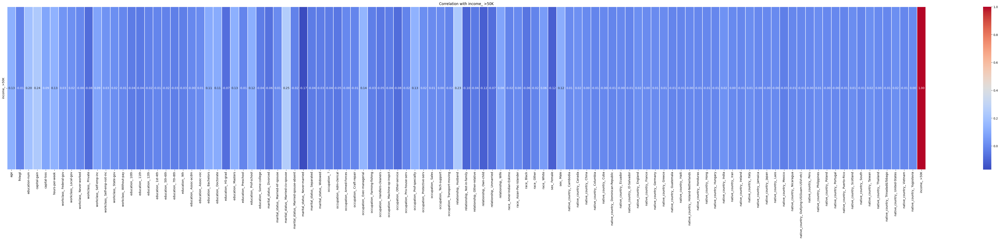

In [ ]:
# Filtering the correlation matrix to only include rows and columns involving 'income_ >50K'
income_corr_matr = corr_matr[['income_ >50K']].T

# Plotting the heatmap
plt.figure(figsize=(70, 10))
sns.heatmap(income_corr_matr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation with income_ >50K')
plt.show()

In [ ]:
# Renaming columns to replace spaces with nothing '' and '-' with '_'
df_train.columns = df_train.columns.str.replace(' ', '').str.replace('-', '_')

In [ ]:
print(list(df_train.columns))

['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay', 'education_10th', 'education_11th', 'education_12th', 'education_1st_4th', 'education_5th_6th', 'education_7th_8th', 'education_9th', 'education_Assoc_acdm', 'education_Assoc_voc', 'education_Bachelors', 'education_Doctorate', 'education_HS_grad', 'education_Masters', 'education_Preschool', 'education_Prof_school', 'education_Some_college', 'marital_status_Divorced', 'marital_status_Married_AF_spouse', 'marital_status_Married_civ_spouse', 'marital_status_Married_spouse_absent', 'marital_status_Never_married', 'marital_status_Separated', 'marital_status_Widowed', 'occupation_?', 'occupation_Adm_clerical', 'occupation_Armed_Forces', 'occupation_Craft_repair', 'occupation_Exec_managerial', 'occupation_Farming_

Wyrzucic:
* fnlwgt  - an estimate of the number of individuals in the population with the same demographics as this individual
* wszystkie workclass
* wszystkie countries
* education_ Doctorate
* Marital_status_ Never_married
* occupation_ Exec_managerial
* relationship_Not_in_family
* race_White
* sex_ Female

In [ ]:
# List of columns to drop
columns_to_drop = ['fnlwgt', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay','education_Doctorate','marital_status_Never_married', 'occupation_Exec_managerial','relationship_Not_in_family', 'race_White','sex_Female', 'native_country_Cambodia', 'native_country_Canada', 'native_country_China', 'native_country_Columbia', 'native_country_Cuba', 'native_country_Dominican_Republic', 'native_country_Ecuador', 'native_country_El_Salvador', 'native_country_England', 'native_country_France', 'native_country_Germany', 'native_country_Greece', 'native_country_Guatemala', 'native_country_Haiti', 'native_country_Holand_Netherlands', 'native_country_Honduras', 'native_country_Hong', 'native_country_Hungary', 'native_country_India', 'native_country_Iran', 'native_country_Ireland', 'native_country_Italy', 'native_country_Jamaica', 'native_country_Japan', 'native_country_Laos', 'native_country_Mexico', 'native_country_Nicaragua', 'native_country_Outlying_US(Guam_USVI_etc)', 'native_country_Peru', 'native_country_Philippines', 'native_country_Poland', 'native_country_Portugal', 'native_country_Puerto_Rico', 'native_country_Scotland', 'native_country_South', 'native_country_Taiwan', 'native_country_Thailand', 'native_country_Trinadad&Tobago', 'native_country_United_States', 'native_country_Vietnam', 'native_country_Yugoslavia']

# Dropping the specified columns
df_train = df_train.drop(columns=columns_to_drop)

print(df_train)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Test set modification with accordance to train set

In [ ]:
names= 'age, workclass, fnlwgt, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loss, hours-per-week, native-country, income'


In [ ]:
col_names = names.split(', ')

In [ ]:
col_names

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [ ]:
df_test = pd.read_csv('/content/drive/MyDrive/ML_final_project/adult_data_test.csv',names=col_names)

In [ ]:
df_test.rename(columns={'marital-status': 'marital_status'}, inplace=True)

In [ ]:
df_test.rename(columns={'native-country': 'native_country'}, inplace=True)

In [ ]:
df_test = pd.get_dummies(df_test, columns=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'], prefix=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'])

In [ ]:
df_test.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K.,income_ >50K.
0,25,226802,7,0,0,40,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
1,38,89814,9,0,0,50,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
2,28,336951,12,0,0,40,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,F

"|1x3 Cross validator" occured in the 1st row so I had to delete the row manually in the CSV.

In [ ]:
df_test.shape

(16281, 109)

In [ ]:
df_test.info() # test set < train set -> good

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16281 entries, 0 to 16280
Columns: 109 entries, age to income_ >50K.
dtypes: bool(103), int64(6)
memory usage: 2.3 MB


In [ ]:
print(list(df_test.columns))

['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair',

In [ ]:
df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

KeyError: "['native_country_ Holand-Netherlands', 'income_ <=50K', 'income_ >50K'] not in index"

KeyError: "['native_country_ Holand-Netherlands', 'income_ <=50K', 'income_ >50K'] not in index" so I need to adjust those column names

It turns out that there is no 'native_country_Holand-Netherlands' column in the test set, as opposed to the train set.

Also, the income columns in the test set have "." at the end of the names. Hence, I need to remove the dots.

In [ ]:
df_test.rename(columns={'income_ <=50K.': 'income_ <=50K'}, inplace=True)
df_test.rename(columns={'income_ >50K.': 'income_ >50K'}, inplace=True)

In [ ]:
df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

In [ ]:
df_test = df_test.drop('income_ <=50K', axis = 1)

In [ ]:
# Dropping rows where native_country_ ? is 1
df_test = df_test[df_test['native_country_ ?'] != 1]

# Resetting index after dropping rows
df_test.reset_index(drop=True, inplace=True)

df_test.drop(columns=['native_country_ ?'], inplace=True)

<ipython-input-45-75665c47badc>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test.drop(columns=['native_country_ ?'], inplace=True)


In [ ]:
# Replacing 'workclass_ ?' with 'workclass_ Private'
df_test['workclass_ Private'] += df_test['workclass_ ?']
df_test.drop(columns=['workclass_ ?'], inplace=True)

In [ ]:
# Renaming columns to replace spaces with nothing '' and '-' with '_'
df_test.columns = df_test.columns.str.replace(' ', '').str.replace('-', '_')

In [ ]:
# List of columns to drop
columns_to_drop_test = ['fnlwgt', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay','education_Doctorate','marital_status_Never_married', 'occupation_Exec_managerial','relationship_Not_in_family', 'race_White','sex_Female', 'native_country_Cambodia', 'native_country_Canada', 'native_country_China', 'native_country_Columbia', 'native_country_Cuba', 'native_country_Dominican_Republic', 'native_country_Ecuador', 'native_country_El_Salvador', 'native_country_England', 'native_country_France', 'native_country_Germany', 'native_country_Greece', 'native_country_Guatemala', 'native_country_Haiti', 'native_country_Honduras', 'native_country_Hong', 'native_country_Hungary', 'native_country_India', 'native_country_Iran', 'native_country_Ireland', 'native_country_Italy', 'native_country_Jamaica', 'native_country_Japan', 'native_country_Laos', 'native_country_Mexico', 'native_country_Nicaragua', 'native_country_Outlying_US(Guam_USVI_etc)', 'native_country_Peru', 'native_country_Philippines', 'native_country_Poland', 'native_country_Portugal', 'native_country_Puerto_Rico', 'native_country_Scotland', 'native_country_South', 'native_country_Taiwan', 'native_country_Thailand', 'native_country_Trinadad&Tobago', 'native_country_United_States', 'native_country_Vietnam', 'native_country_Yugoslavia']

# Dropping the specified columns
df_test = df_test.drop(columns=columns_to_drop_test)

print(df_test)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Models

In [ ]:
# Setting a seed for the random number generator
seed = 42

# Randomizing all observations in df_train
df_train = df_train.sample(frac=1, random_state=seed).reset_index(drop=True) # reset_index(drop=True) resets the index of the DataFrame to the default integer index and drop=True prevents the old indices from being added as a new column in the DataFrame.

# Randomizing all observations in df_test
df_test = df_test.sample(frac=1, random_state=seed).reset_index(drop=True)


In [ ]:
X_train = df_train.drop('income_>50K', axis=1)
X_test = df_test.drop('income_>50K', axis=1)
y_train = df_train['income_>50K']
y_test =  df_test['income_>50K']

Logistic Regression:

In [ ]:
model_log = LogisticRegression(max_iter=1000)

model_log.fit(X_train, y_train)

predictions_log = model_log.predict(X_test)

accuracy_log = accuracy_score(y_test, predictions_log)
print("Accuracy:", accuracy_log)

Accuracy: 0.8081464359342787


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Calculating and printing the metrics
accuracy_log = accuracy_score(y_test, predictions_log)
precision_log = precision_score(y_test, predictions_log)
recall_log = recall_score(y_test, predictions_log)
f1_log = f1_score(y_test, predictions_log)

print(f'Accuracy: {accuracy_log}')
print(f'Precision: {precision_log}')
print(f'Recall: {recall_log}')
print(f'F1 Score: {f1_log}')

Accuracy: 0.8081464359342787
Precision: 0.9354037267080745
Recall: 0.1996288441145281
F1 Score: 0.3290364867817348


KNN:

In [ ]:
model_knn = KNeighborsClassifier(n_neighbors=5)

model_knn.fit(X_train, y_train)

predictions_knn = model_knn.predict(X_test)

accuracy_knn = accuracy_score(y_test, predictions_knn)
print("KNN Accuracy:", accuracy_knn)

KNN Accuracy: 0.8356344099456487


In [ ]:
# Calculating and printing the metrics
accuracy_knn = accuracy_score(y_test, predictions_knn)
precision_knn = precision_score(y_test, predictions_knn)
recall_knn = recall_score(y_test, predictions_knn)
f1_knn = f1_score(y_test, predictions_knn)

print(f'Accuracy: {accuracy_knn}')
print(f'Precision: {precision_knn}')
print(f'Recall: {recall_knn}')
print(f'F1 Score: {f1_knn}')

Accuracy: 0.8356344099456487
Precision: 0.8992302309307207
Recall: 0.3406680805938494
F1 Score: 0.49413574312632186


Random Forest and SVM:

In [ ]:
# Training RandomForestClassifier
model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)
predictions_rf = model_rf.predict(X_test)

# Training SVM
model_svm = SVC()
model_svm.fit(X_train, y_train)
predictions_svm = model_svm.predict(X_test)

In [ ]:
# Evaluating the models
def evaluate_model(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    return accuracy, precision, recall, f1

# RandomForest metrics
rf_metrics = evaluate_model(y_test, predictions_rf)
print(f"RandomForest - Accuracy: {rf_metrics[0]}, Precision: {rf_metrics[1]}, Recall: {rf_metrics[2]}, F1 Score: {rf_metrics[3]}")

# SVM metrics
svm_metrics = evaluate_model(y_test, predictions_svm)
print(f"SVM - Accuracy: {svm_metrics[0]}, Precision: {svm_metrics[1]}, Recall: {svm_metrics[2]}, F1 Score: {svm_metrics[3]}")

RandomForest - Accuracy: 0.8348847379271569, Precision: 0.8775919732441472, Recall: 0.34782608695652173, F1 Score: 0.49819631668881714
SVM - Accuracy: 0.8024614231273818, Precision: 0.9565868263473054, Recall: 0.16940615058324496, F1 Score: 0.28783783783783784


y mean:

In [ ]:
# Calculating the mean of the 'income_>50K' column
mean_income_test = df_test['income_>50K'].mean()

print("Mean of income_>50K:", mean_income_test) # this can be the baseline to determine whether the accuracy is good

Mean of income_>50K: 0.23564690447929032


Classification reports:

In [ ]:
print('------------------ Classification report: Logistic regression ------------------ \n ')
print(classification_report(y_test, predictions_log))
print('\n')
print('------------------ Classification report: KNN ------------------ \n ')
print(classification_report(y_test, predictions_knn))
print('\n')
print('------------------ Classification report: Random forest ------------------ \n ')
print(classification_report(y_test, predictions_rf))
print('\n')
print('------------------ Classification report: SVM ------------------ \n ')
print(classification_report(y_test, predictions_svm))
print('\n')

------------------ Classification report: Logistic regression ------------------ 
 
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     12235
           1       0.94      0.20      0.33      3772

    accuracy                           0.81     16007
   macro avg       0.87      0.60      0.61     16007
weighted avg       0.83      0.81      0.76     16007



------------------ Classification report: KNN ------------------ 
 
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     12235
           1       0.90      0.34      0.49      3772

    accuracy                           0.84     16007
   macro avg       0.86      0.66      0.70     16007
weighted avg       0.85      0.84      0.81     16007



------------------ Classification report: Random forest ------------------ 
 
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     12235
   

Confusion matrices:

In [ ]:
print('------------------ Confusion matrix: Logistic regression ------------------ \n ')
print(pd.crosstab(y_test, predictions_log,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: KNN ------------------ \n ')
print(pd.crosstab(y_test, predictions_knn,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: Random forest ------------------ \n ')
print(pd.crosstab(y_test, predictions_rf,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: SVM ------------------ \n ')
print(pd.crosstab(y_test, predictions_svm,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')

------------------ Confusion matrix: Logistic regression ------------------ 
 
Predicted      0    1    All
Actual                      
0          12183   52  12235
1           3019  753   3772
All        15202  805  16007


------------------ Confusion matrix: KNN ------------------ 
 
Predicted      0     1    All
Actual                       
0          12091   144  12235
1           2487  1285   3772
All        14578  1429  16007


------------------ Confusion matrix: Random forest ------------------ 
 
Predicted      0     1    All
Actual                       
0          12052   183  12235
1           2460  1312   3772
All        14512  1495  16007


------------------ Confusion matrix: SVM ------------------ 
 
Predicted      0    1    All
Actual                      
0          12206   29  12235
1           3133  639   3772
All        15339  668  16007


